## This notebook will be used to briefly analyze features for the various markers.

In [807]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from pca import pca

In [808]:
# First, import data.
feature_dir = "/Users/agreic/Desktop/testing_dir/fit_output/"
# In the feature_dir, there are directories for each marker. Those have the scaled features used for training in the logreg subdir,
# One csv for 2D and one for 3D. The labels are saved with the same filename with _labels appended.

# Get the list of markers
markers = os.listdir(feature_dir)
markers = [x for x in markers if not x.startswith(".")]

big_csv_2d = pd.DataFrame()
big_csv_3d = pd.DataFrame()

# For each marker, load the features and labels
for marker in markers:
    print("Processing marker: ", marker)

    # Load the labels and features
    features_2D_path = os.path.join(feature_dir, marker, "logreg", "2d", "train_2D.csv")
    features_3D_path = os.path.join(feature_dir, marker, "logreg", "3d", "train_3D.csv")
    labels_2D_path = os.path.join(feature_dir, marker, "logreg", "2d", "train_2D_labels.csv")
    labels_3D_path = os.path.join(feature_dir, marker, "logreg", "3d", "train_3D_labels.csv")

    features_2D = pd.read_csv(features_2D_path, index_col=0, header=0)
    features_3D = pd.read_csv(features_3D_path, index_col=0, header=0)
    labels_2D = pd.read_csv(labels_2D_path, index_col=0, header=0)
    labels_3D = pd.read_csv(labels_3D_path, index_col=0, header=0)

    # Combine the features and labels
    features_2D["label"] = labels_2D["label"]
    features_3D["label"] = labels_3D["label"]

    # Add dimension and marker columns
    features_2D["dim"] = "2D"
    features_2D["marker"] = marker
    features_3D["dim"] = "3D"
    features_3D["marker"] = marker

    # Concatenate to the big csv
    big_csv_2d = pd.concat([big_csv_2d, features_2D])
    big_csv_3d = pd.concat([big_csv_3d, features_3D])

print(big_csv_2d.shape)
print(big_csv_3d.shape)

print(big_csv_3d)

Processing marker:  PU1
Processing marker:  SCA1
Processing marker:  GATA1
Processing marker:  CD41
(9606, 132)
(9606, 406)
          area  area_bbox  area_convex  area_filled  axis_major_length  \
0    -0.152281  -0.095150    -0.126149    -0.152281          -0.313288   
1    -0.128573  -0.055280    -0.097783    -0.128573           0.239744   
2    -0.064255  -0.062614    -0.071070    -0.064255          -0.200898   
3    -0.159201  -0.082745    -0.119471    -0.159201          -0.165464   
4    -0.114167  -0.076216    -0.089387    -0.114167          -0.103604   
...        ...        ...          ...          ...                ...   
2134  1.765235   1.505629     1.659963     1.765235           2.537543   
2135  1.014556   1.238711     0.989189     1.014555           2.008565   
2136  2.977971   2.429167     2.723432     2.977971           3.539949   
2137  1.492659   1.057046     1.329983     1.492659           2.242226   
2138  1.478044   1.112822     1.316733     1.478043           

In [809]:
# Color maker:
from matplotlib.colors import to_rgb, to_hex
import itertools

# Starting palette with distinct colors for single markers
palette = {
    "PU1": "#1f77b4",   # muted blue
    "SCA1": "#ff7f0e",  # muted orange
    "GATA1": "#2ca02c", # muted green
    "CD41": "#d62728",   # muted red
    "None": "white"      # white for no markers
}

# Function to calculate combined color
def mix_colors(markers):
    # Get the RGB colors of each marker
    rgb_colors = [to_rgb(palette[marker]) for marker in markers]
    # Calculate the average RGB values
    avg_rgb = tuple(sum(col) / len(markers) for col in zip(*rgb_colors))
    # Convert the average RGB back to hex
    return to_hex(avg_rgb)

# Generate colors for all unique combinations of the markers with all permutations
combined_palette = {}
for r in range(1, len(palette) + 1):
    for combo in itertools.combinations(palette.keys(), r):
        # Calculate the mixed color for the combination
        color = mix_colors(combo)
        # Create an entry for each permutation of the combination
        for perm in itertools.permutations(combo):
            combo_name = ", ".join(perm)
            combined_palette[combo_name] = color

# Display the final combined_palette dictionary
combined_palette


{'PU1': '#1f77b4',
 'SCA1': '#ff7f0e',
 'GATA1': '#2ca02c',
 'CD41': '#d62728',
 'None': '#ffffff',
 'PU1, SCA1': '#8f7b61',
 'SCA1, PU1': '#8f7b61',
 'PU1, GATA1': '#268c70',
 'GATA1, PU1': '#268c70',
 'PU1, CD41': '#7a4f6e',
 'CD41, PU1': '#7a4f6e',
 'PU1, None': '#8fbbda',
 'None, PU1': '#8fbbda',
 'SCA1, GATA1': '#96901d',
 'GATA1, SCA1': '#96901d',
 'SCA1, CD41': '#eb531b',
 'CD41, SCA1': '#eb531b',
 'SCA1, None': '#ffbf86',
 'None, SCA1': '#ffbf86',
 'GATA1, CD41': '#81642a',
 'CD41, GATA1': '#81642a',
 'GATA1, None': '#96d096',
 'None, GATA1': '#96d096',
 'CD41, None': '#eb9393',
 'None, CD41': '#eb9393',
 'PU1, SCA1, GATA1': '#6e874f',
 'PU1, GATA1, SCA1': '#6e874f',
 'SCA1, PU1, GATA1': '#6e874f',
 'SCA1, GATA1, PU1': '#6e874f',
 'GATA1, PU1, SCA1': '#6e874f',
 'GATA1, SCA1, PU1': '#6e874f',
 'PU1, SCA1, CD41': '#a75f4e',
 'PU1, CD41, SCA1': '#a75f4e',
 'SCA1, PU1, CD41': '#a75f4e',
 'SCA1, CD41, PU1': '#a75f4e',
 'CD41, PU1, SCA1': '#a75f4e',
 'CD41, SCA1, PU1': '#a75f4e',
 '

In [810]:
# print(big_csv_3d['marker'].unique())

df3 = big_csv_3d[big_csv_3d['marker'] == 'CD41'].copy()
# Create an ID column
df3['ID'] = df3.index
print(df3['dim'].unique())
df3.drop(columns=['dim'], inplace=True)

df_pivot3 = df3.pivot_table(index='ID', columns='marker', values='label', aggfunc='max', fill_value=0)#.reset_index()
# Add ALL other columns
df_pivot3 = df_pivot3.merge(df3.drop(columns=['label', 'marker']), on='ID', how='left')

df_pivot3['combined_marker_status'] = df_pivot3.apply(
    lambda row: ', '.join([marker for marker in df3['marker'].unique() if row.get(marker, 0) == 1]),
    axis=1
)

df_pivot3['combined_marker_status'] = df_pivot3['combined_marker_status'].apply(lambda x: 'None' if x == '' else x)

# Print any NaN values
print(df_pivot3.columns[df_pivot3.isna().any()].tolist())
# Remove the columns with NaN values
df_pivot3.dropna(axis=1, inplace=True)

print(df_pivot3 ,df3.shape)

['3D']
['feret_diameter_max']
        ID  CD41      area  area_bbox  area_convex  area_filled  \
0        0     0  0.032891   0.153559     0.057294     0.032891   
1        1     0 -0.155418  -0.162958    -0.160473    -0.155418   
2        2     0 -0.024356  -0.031552    -0.022138    -0.024356   
3        3     0 -0.152903  -0.164815    -0.161400    -0.152903   
4        4     0 -0.171118  -0.119537    -0.145232    -0.171118   
...    ...   ...       ...        ...          ...          ...   
2134  2134     1  1.765235   1.505629     1.659963     1.765235   
2135  2135     1  1.014556   1.238711     0.989189     1.014555   
2136  2136     1  2.977971   2.429167     2.723432     2.977971   
2137  2137     1  1.492659   1.057046     1.329983     1.492659   
2138  2138     1  1.478044   1.112822     1.316733     1.478043   

      axis_major_length  axis_minor_length  equivalent_diameter_area  \
0              1.002651           0.223347                  0.563489   
1              0.2721

/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/842497605.py:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pivot = df.pivot_table(index=index_columns, columns='marker', values='label', aggfunc='max', fill_value=0).reset_index()
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/842497605.py:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pivot = df.pivot_table(index=index_columns, columns='marker', values='label', aggfunc='max', fill_value=0).reset_index()
/var/folders/33/8fj_gn7d4wj3r7

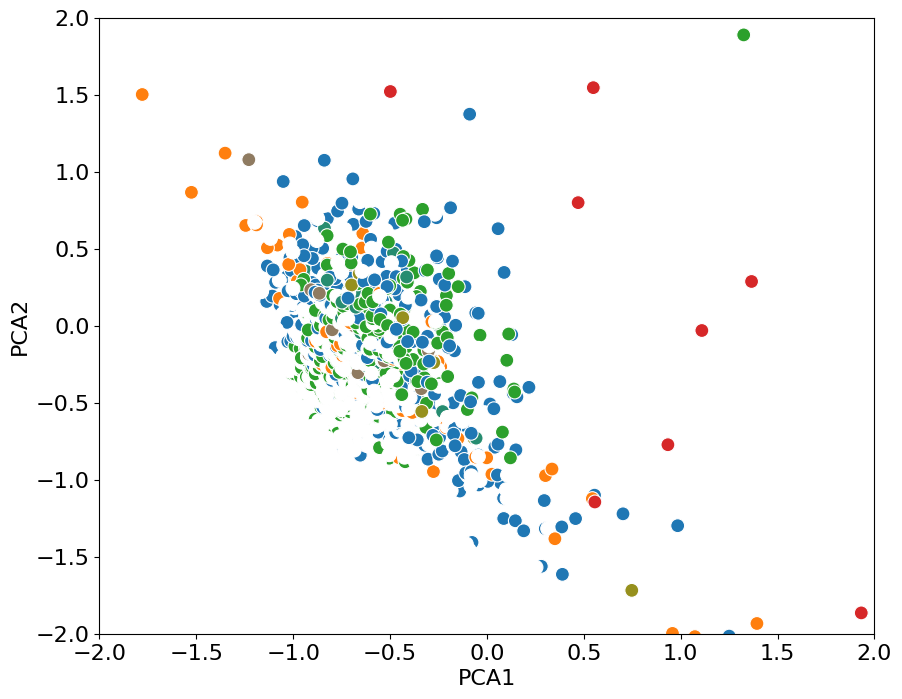

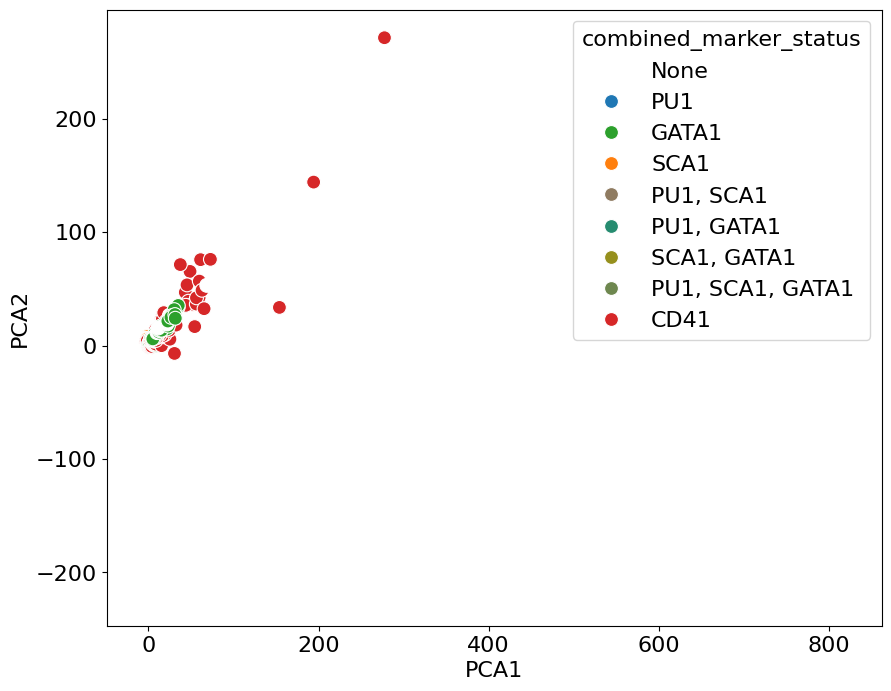

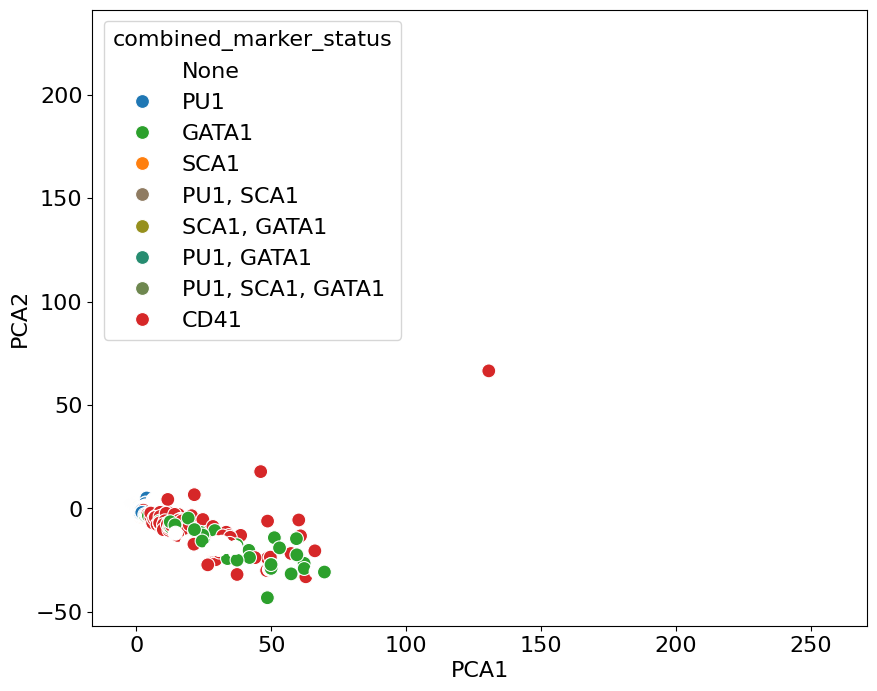

In [811]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Replace big_csv_3d with your actual DataFrame
# df = big_csv_3d[big_csv_3d['marker'] != 'CD41'].copy()
# df2 = big_csv_2d[big_csv_2d['marker'] != 'CD41'].copy()

df = big_csv_3d.copy()
df2 = big_csv_2d.copy()

# Drop feret_diameter_max column
df = df.drop(columns=['feret_diameter_max'])
df2 = df2.drop(columns=['feret_diameter_max'])

# df3 = big_csv_3d[big_csv_3d['marker'] == 'CD41'].copy()
df4 = big_csv_2d[big_csv_2d['marker'] == 'CD41'].copy()

# Drop the dim column
df.drop(columns=['dim'], inplace=True)
df2.drop(columns=['dim'], inplace=True)
# df3.drop(columns=['dim'], inplace=True)
df4.drop(columns=['dim'], inplace=True)

# Step 1: Pivot table to create one row per cell with markers as columns
# Use all columns except 'label' and 'marker' as the index for each unique cell
index_columns = list(set(df.columns) - {'label', 'marker'})
index_columns2 = list(set(df2.columns) - {'label', 'marker'})
# index_columns3 = list(set(df3.columns) - {'label', 'marker'})
index_columns4 = list(set(df4.columns) - {'label', 'marker'})

df_pivot = df.pivot_table(index=index_columns, columns='marker', values='label', aggfunc='max', fill_value=0).reset_index()
df_pivot2 = df2.pivot_table(index=index_columns2, columns='marker', values='label', aggfunc='max', fill_value=0).reset_index()
# df_pivot3 = df3.pivot_table(index=index_columns3, columns='marker', values='label', aggfunc='max', fill_value=0).reset_index()
df_pivot4 = df4.pivot_table(index=index_columns4, columns='marker', values='label', aggfunc='max', fill_value=0).reset_index()

# Step 2: Create a combined marker status label for each cell
df_pivot['combined_marker_status'] = df_pivot.apply(
    lambda row: ', '.join([marker for marker in df['marker'].unique() if row.get(marker, 0) == 1]),
    axis=1
)
df_pivot2['combined_marker_status'] = df_pivot2.apply(
    lambda row: ', '.join([marker for marker in df2['marker'].unique() if row.get(marker, 0) == 1]),
    axis=1
)
# df_pivot3['combined_marker_status'] = df_pivot3.apply(
#     lambda row: ', '.join([marker for marker in df3['marker'].unique() if row.get(marker, 0) == 1]),
#     axis=1
# )
df_pivot4['combined_marker_status'] = df_pivot4.apply(
    lambda row: ', '.join([marker for marker in df4['marker'].unique() if row.get(marker, 0) == 1]),
    axis=1
)

# Create a 'Negative' label for cells with no markers
df_pivot['combined_marker_status'] = df_pivot['combined_marker_status'].apply(lambda x: 'None' if x == '' else x)
df_pivot2['combined_marker_status'] = df_pivot2['combined_marker_status'].apply(lambda x: 'None' if x == '' else x)
# df_pivot3['combined_marker_status'] = df_pivot3['combined_marker_status'].apply(lambda x: 'None' if x == '' else x)
df_pivot4['combined_marker_status'] = df_pivot4['combined_marker_status'].apply(lambda x: 'None' if x == '' else x)

# Step 3: Prepare data for PCA
# Select only feature columns for PCA input
feature_columns = [col for col in df_pivot.columns if not col.startswith('marker') and col != 'combined_marker_status' and col != 'label']
feature_columns2 = [col for col in df_pivot2.columns if not col.startswith('marker') and col != 'combined_marker_status' and col != 'label']
feature_columns3 = [col for col in df_pivot3.columns if not col.startswith('marker') and col != 'combined_marker_status' and col != 'label']
feature_columns4 = [col for col in df_pivot4.columns if not col.startswith('marker') and col != 'combined_marker_status' and col != 'label']
features = df_pivot[feature_columns]
features2= df_pivot2[feature_columns2]
features3= df_pivot3[feature_columns3]
features4= df_pivot4[feature_columns4]

# Step 4: Use PCA and color by combined_marker_status
pca = PCA(n_components=2)
pca2 = PCA(n_components=2)
pca3 = PCA(n_components=2)
pca4 = PCA(n_components=2)
pca_results = pca.fit_transform(features)
pca_results2 = pca2.fit_transform(features2)
pca_results3 = pca3.fit_transform(features3)
pca_results4 = pca4.fit_transform(features4)

# Add PCA results and labels to the DataFrame
df_pivot['PCA1'] = pca_results[:, 0]
df_pivot['PCA2'] = pca_results[:, 1]
df_pivot2['PCA1'] = pca_results2[:, 0]
df_pivot2['PCA2'] = pca_results2[:, 1]
df_pivot3['PCA1'] = pca_results3[:, 0]
df_pivot4['PCA1'] = pca_results4[:, 0]
df_pivot3['PCA2'] = pca_results3[:, 1]
df_pivot4['PCA2'] = pca_results4[:, 1]

# Plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100)
lims = [-2,2]

plt.ylim(lims)
plt.xlim(lims)
plt.legend([],[], frameon=False)
plt.show()

# Plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100)
plt.show()

plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot2, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100)
plt.show()


In [812]:
_3D_all = df_pivot.copy()
_2D_all = df_pivot2.copy()
_3D_CD41 = df_pivot3.copy()
_2D_CD41 = df_pivot4.copy()

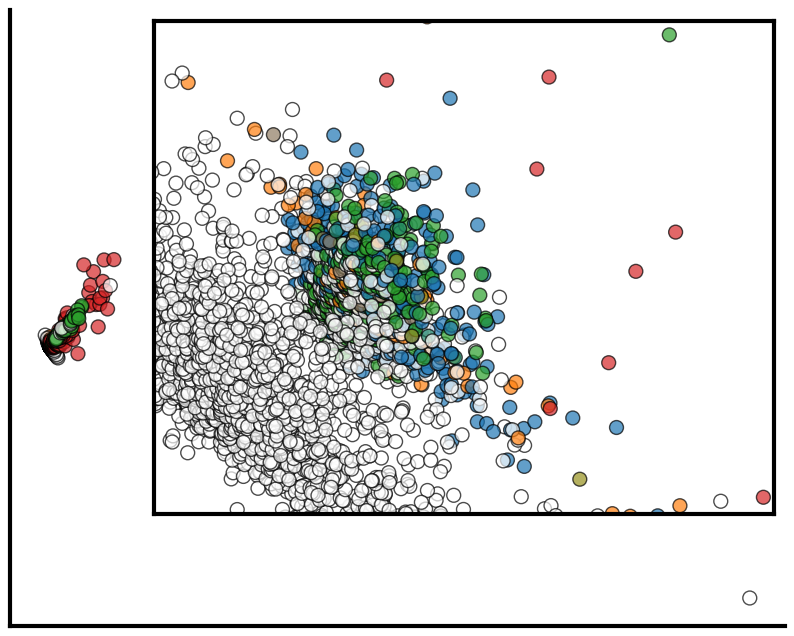

In [813]:
########## ZOOMED IN PLOT ##########
# Import necessary functions
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

# Main plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100, alpha=0.7, edgecolor='black', linewidth=1)
plt.title('')
# plt.legend(loc='upper right', title='')
# Remove legend
plt.legend([], [], frameon=False)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(0)
plt.gca().spines['right'].set_linewidth(0)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Keep only 3 ticks on each axis
# plt.gca().set_xticks([0, 800])
# plt.gca().set_yticks([-40, 0, 80])
# Remove ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])
# Remove labels
plt.gca().set_xlabel('')
plt.gca().set_ylabel('')


# Create an inset for zooming in on a specific area
axins = inset_axes(plt.gca(), width='80%', height='80%', loc='upper right')  # Adjust size and location
sns.scatterplot(data=df_pivot, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100, ax=axins, alpha=0.7, edgecolor='black', linewidth=1)
# Define the limits for the zoomed area
lims = [-2, 2]
# Set limits for the inset
axins.set_xlim(lims)  # Adjust these limits as needed
axins.set_ylim(lims)  # Adjust these limits as needed

# Optionally remove the legend from the inset plot
axins.legend([], [], frameon=False)
# Remove axis names, ticks, and labels
# axins.set_xticks([-2, 0, 2])
# axins.set_yticks([-2, 0, 2])
axins.set_xticks([])
axins.set_yticks([])

axins.set_xlabel('')
axins.set_ylabel('')

# Move the legend outside the plot
# plt.legend(title='', bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(thickness)
plt.gca().spines['right'].set_linewidth(thickness)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Draw lines from the inset to the main plot
# mark_inset(plt.gca(), axins, loc1=1, loc2=3, fc="none", ec='black', lw=5)

# Show the plots
plt.show()




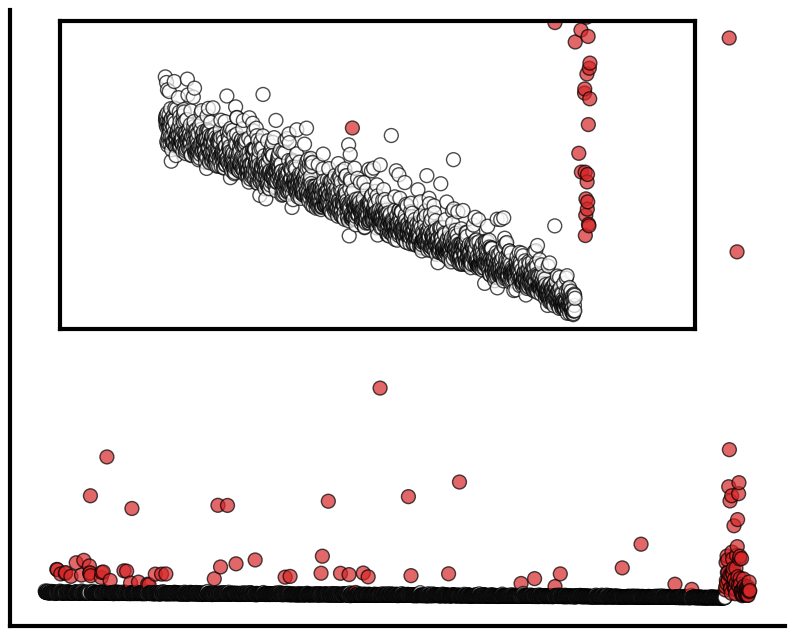

In [814]:
########## ZOOMED IN PLOT ########## CD41
# Import necessary functions
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

# Main plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot3, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100, alpha=0.7, edgecolor='black', linewidth=1)
plt.title('')
# plt.legend(loc='upper right', title='')
# Remove legend
plt.legend([], [], frameon=False)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

plt.legend(title='', bbox_to_anchor=(1.15, 1), loc='upper right', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(0)
plt.gca().spines['right'].set_linewidth(0)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# # Keep only 3 ticks on each axis
# plt.gca().set_xticks([-1000, 0, 1000])
# plt.gca().set_yticks([0, 400])
plt.gca().set_xticks([])
plt.gca().set_yticks([])
# Remov elabel
plt.gca().set_xlabel('')
plt.gca().set_ylabel('')

# Remove legend
plt.legend([], [], frameon=False)

# Create an inset for zooming in on a specific area
axins = inset_axes(plt.gca(), width='82%', height='50%', loc='upper left', bbox_to_anchor=(0.05, 0, 1, 1), bbox_transform=plt.gca().transAxes)  # Adjust size and location
sns.scatterplot(data=df_pivot3, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100, ax=axins, alpha=0.7, edgecolor='black', linewidth=1)
# # Define the limits for the zoomed area
lims = [-4, 2.5]
# lims = [-2, 2]
# # Set limits for the inset
axins.set_xlim(-1600,1600)  # Adjust these limits as needed
axins.set_ylim(lims)  # Adjust these limits as needed
# axins.set_xlim([-4.1,5])

# Optionally remove the legend from the inset plot
axins.legend([], [], frameon=False)
# Remove axis names, ticks, and labels
# axins.set_xticks([-1000, 0, 1000])
# axins.set_yticks([-4, 0, 2])
axins.set_xticks([])
axins.set_yticks([])
axins.set_xlabel('')
axins.set_ylabel('')

# Move the legend outside the plot

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(thickness)
plt.gca().spines['right'].set_linewidth(thickness)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Draw lines from the inset to the main plot
# mark_inset(plt.gca(), axins, loc1=1, loc2=3, fc="none", ec='black', lw=5)

# Show the plots
plt.show()




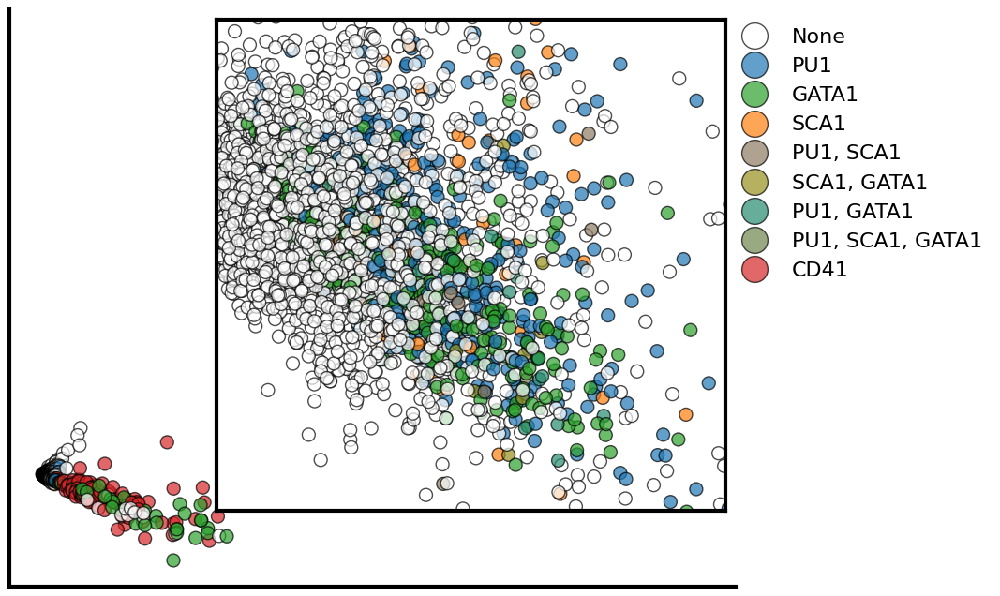

In [815]:
########## ZOOMED IN PLOT ########## 2d
# Import necessary functions
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

# Main plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot2, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100, alpha=0.7, edgecolor='black', linewidth=1)
plt.title('')
# plt.legend(loc='upper right', title='')
# Remove legend
plt.legend([], [], frameon=False)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(0)
plt.gca().spines['right'].set_linewidth(0)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Keep only 3 ticks on each axis
# plt.gca().set_xticks([0, 300])
# plt.gca().set_yticks([-150, 0, 50])
plt.gca().set_xticks([])
plt.gca().set_yticks([])
# Remove labels
plt.gca().set_xlabel('')
plt.gca().set_ylabel('')

# Create an inset for zooming in on a specific area
axins = inset_axes(plt.gca(), width='70%', height='85%', loc='upper right')  # Adjust size and location
sns.scatterplot(data=df_pivot2, x='PCA1', y='PCA2', hue='combined_marker_status', palette=combined_palette, s=100, ax=axins, alpha=0.7, edgecolor='black', linewidth=1)
# Define the limits for the zoomed area
lims = [-2, 2]
# Set limits for the inset
axins.set_xlim(lims)  # Adjust these limits as needed
axins.set_ylim(lims)  # Adjust these limits as needed

# Optionally remove the legend from the inset plot
axins.legend([], [], frameon=False)
# Remove axis names, ticks, and labels
# axins.set_xticks([-2, 0, 2])
# axins.set_yticks([-2, 0, 2])
axins.set_xticks([])
axins.set_yticks([])
axins.set_xlabel('')
axins.set_ylabel('')

# Move the legend outside the plot
plt.legend(title='', bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(thickness)
plt.gca().spines['right'].set_linewidth(thickness)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Draw lines from the inset to the main plot
# mark_inset(plt.gca(), axins, loc1=1, loc2=3, fc="none", ec='black', lw=5)

# Show the plots
plt.show()




/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2478459901.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pivot['color'] = df_pivot['combined_marker_status'].apply(
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2478459901.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2478459901.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2478459901.py:71: UserWarning: This figure includes Axes that are not compati

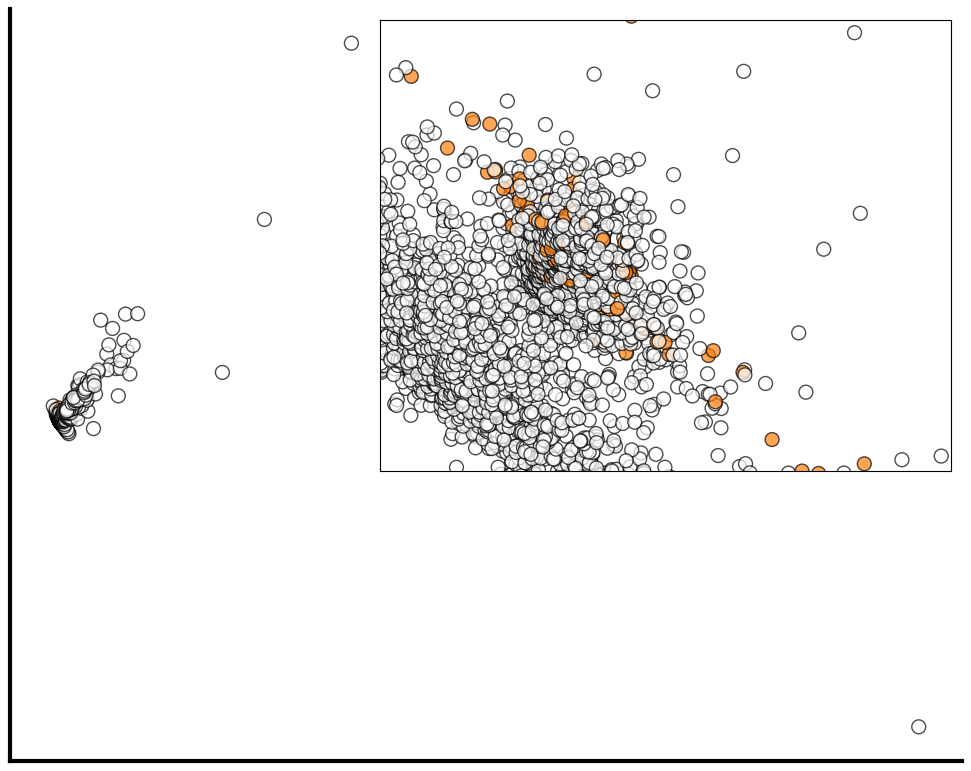

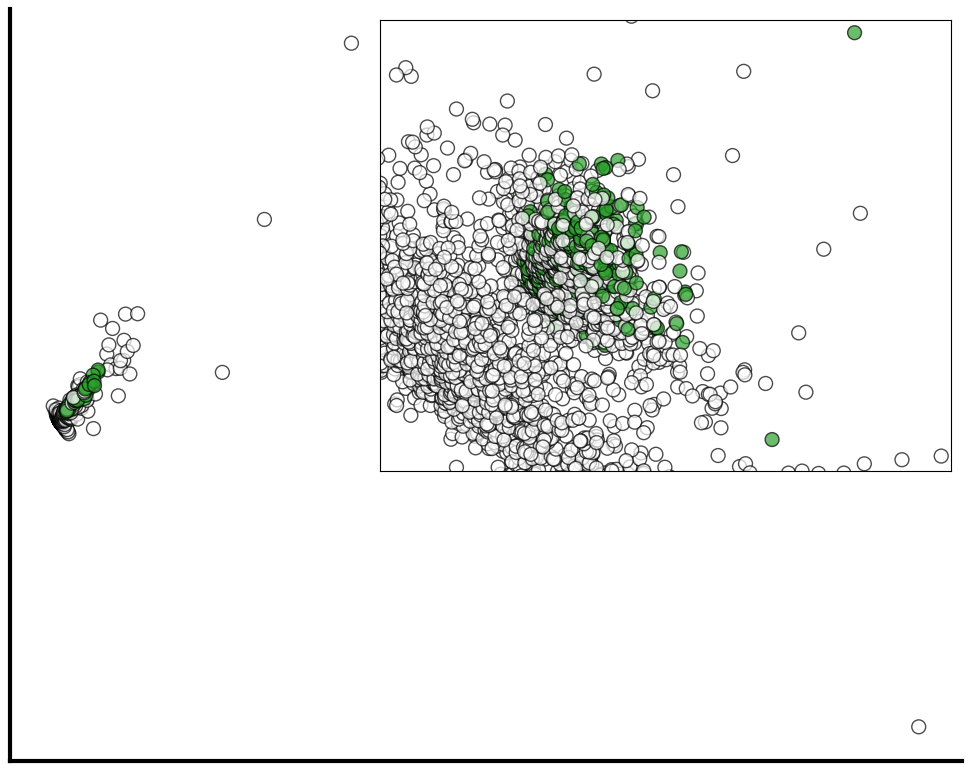

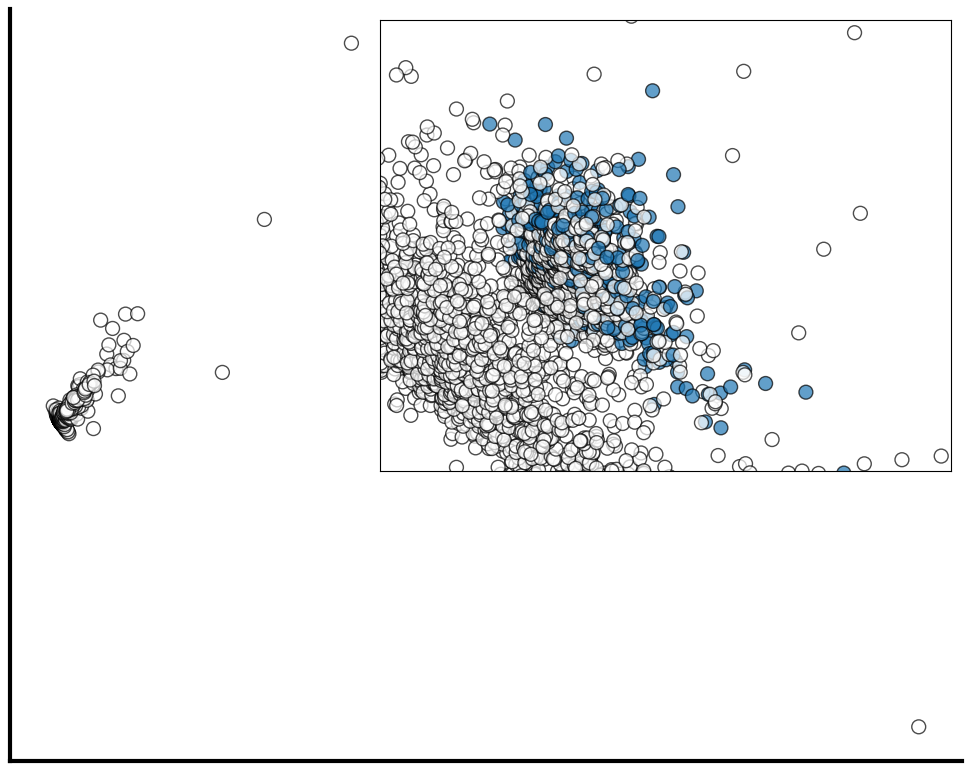

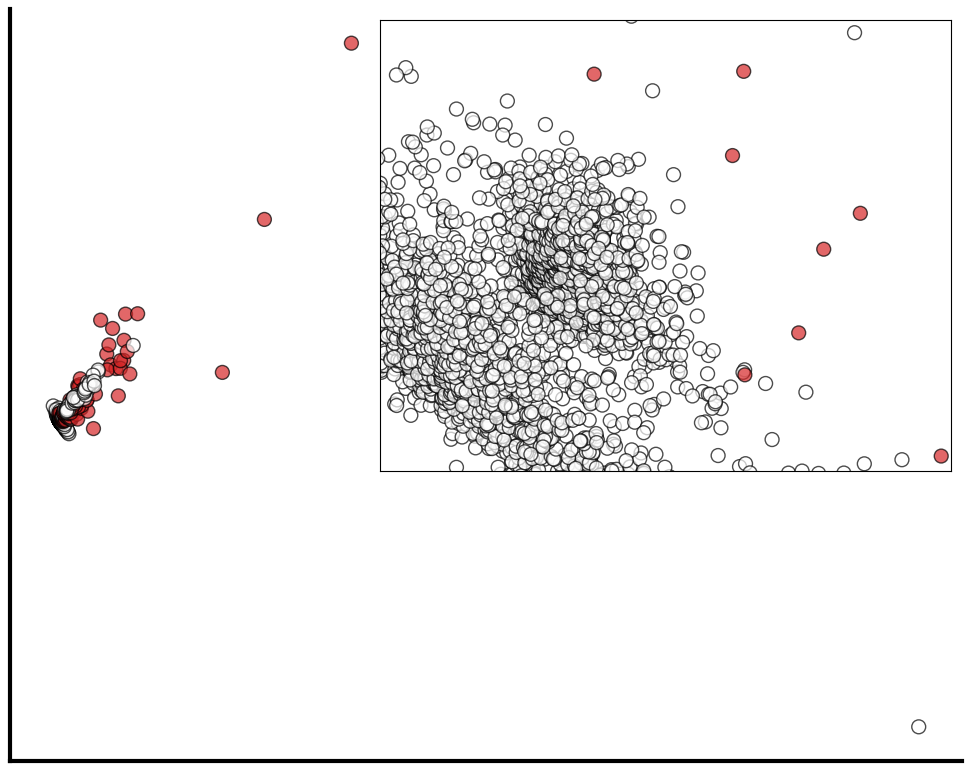

In [816]:
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# 3D

plot_dict = {}  

# Define thickness and font size for consistency
thickness = 3
font_size = 16

# List of markers to plot individually
markers = ['SCA1', 'GATA1', 'PU1', 'CD41']  # Add other markers as needed
# markers = ['SCA1', 'GATA1', 'PU1']
# Set font size for all elements globally
plt.rc('font', size=font_size)
plt.rc('axes', titlesize=font_size)
plt.rc('axes', labelsize=font_size)
plt.rc('legend', fontsize=font_size)
plt.rc('figure', titlesize=font_size)

# Create individual plots for each marker
for marker in markers:
    # Set up figure and main plot
    fig, ax = plt.subplots(figsize=(10, 8))
    df_pivot['color'] = df_pivot['combined_marker_status'].apply(
        lambda x: combined_palette[marker] if marker in x else 'white'
    )

    # Main scatter plot
    sns.scatterplot(
        data=df_pivot, x='PCA1', y='PCA2', ax=ax, color=df_pivot['color'],
        s=100, edgecolor='black', linewidth=1, alpha=0.7
    )

    # Customize main plot appearance
    # ax.set_title(f"{marker}")
    ax.legend([], [], frameon=False)  # Remove main plot legend
    ax.spines['top'].set_linewidth(0)
    ax.spines['right'].set_linewidth(0)
    ax.spines['bottom'].set_linewidth(thickness)
    ax.spines['left'].set_linewidth(thickness)
    ax.xaxis.set_tick_params(width=thickness)
    ax.yaxis.set_tick_params(width=thickness)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    # ax.set_xticks([0, 800])
    # ax.set_yticks([-40, 0, 80])
    # ax.set_xlabel("PCA 1" if marker == markers[0] else '')
    # ax.set_ylabel("PCA 2" if marker == markers[0] else '')

    # Create inset plot
    axins = inset_axes(ax, width="60%", height="60%", loc='upper right')
    sns.scatterplot(
        data=df_pivot, x='PCA1', y='PCA2', color=df_pivot['color'], s=100, ax=axins, edgecolor='black', linewidth=1, alpha=0.7
    )
    
    # Inset appearance
    axins.set_xlim([-2, 2])  # Adjust limits as needed
    axins.set_ylim([-2, 2])  # Adjust limits as needed
    axins.set_xticks([])
    axins.set_yticks([])
    axins.set_xlabel('')
    axins.set_ylabel('')
    axins.legend([], [], frameon=False)  # Remove inset legend

    # Show plot
    plt.tight_layout()

    # Add the plot to a dict:
    plot_dict[marker] = fig

    # plt.show()

/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2961625184.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pivot2['color'] = df_pivot2['combined_marker_status'].apply(
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2961625184.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2961625184.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/2961625184.py:72: UserWarning: This figure includes Axes that are not compa

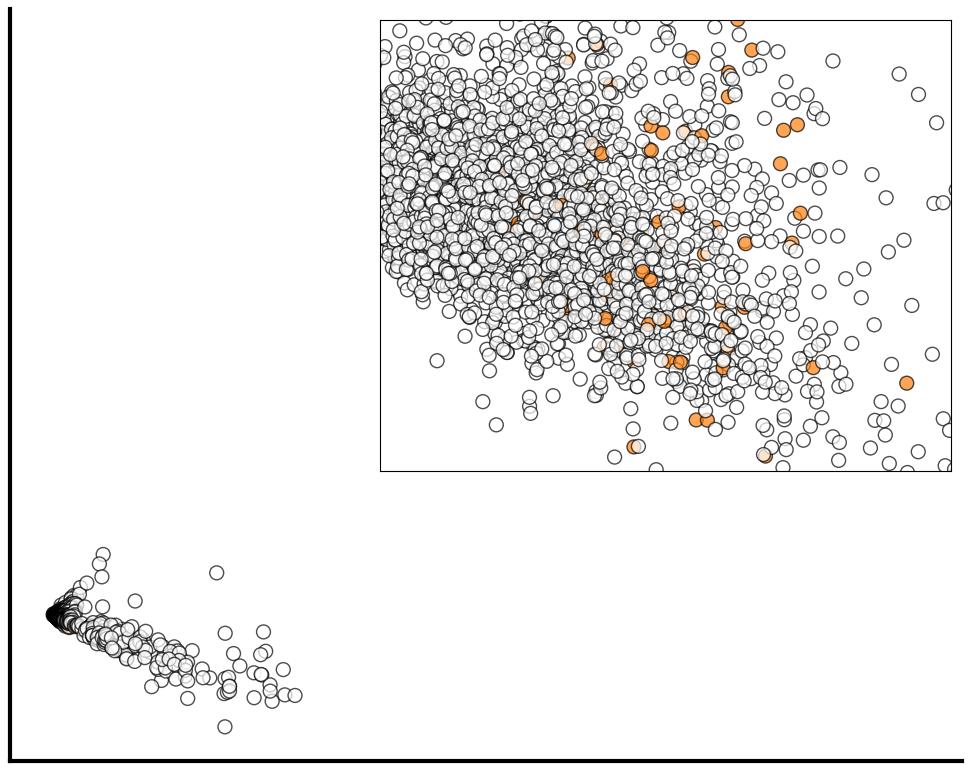

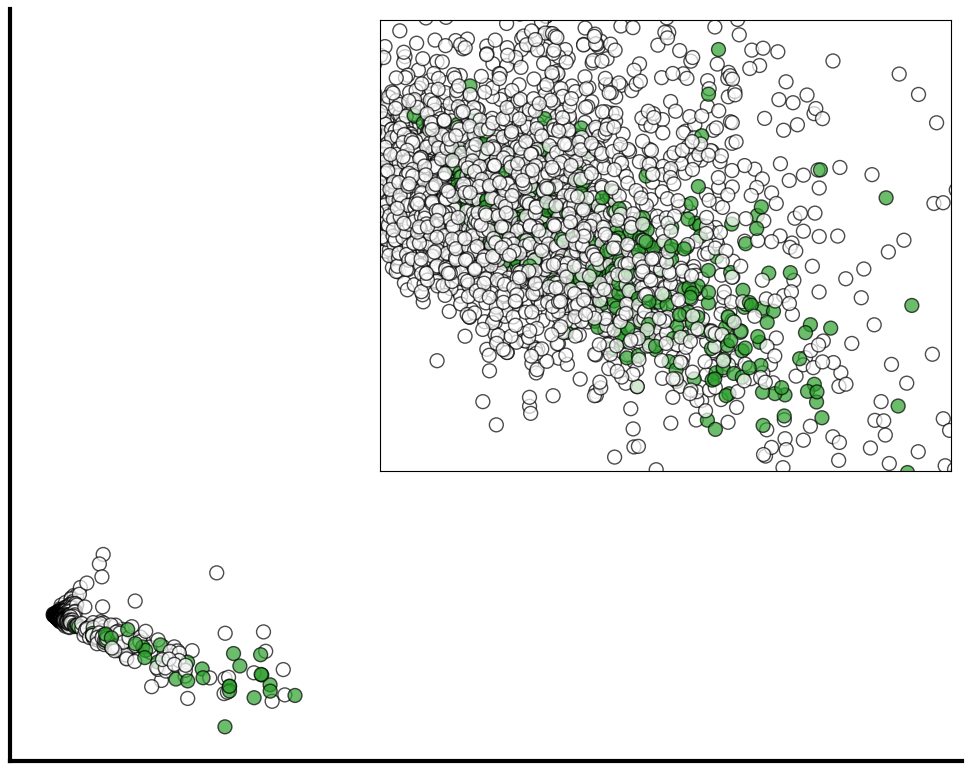

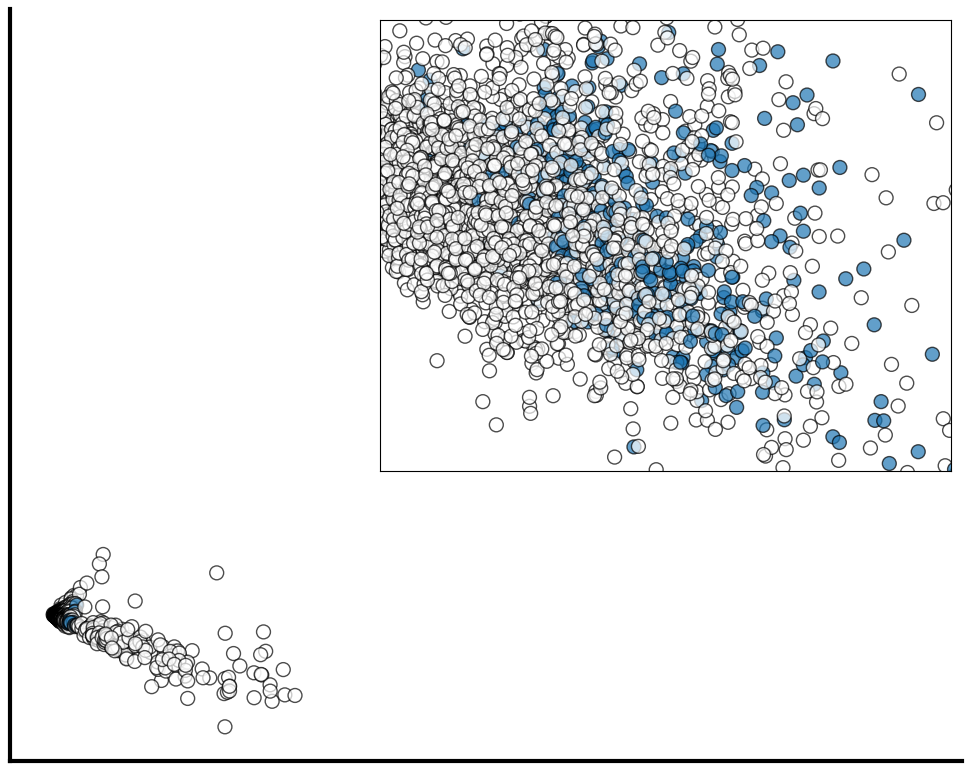

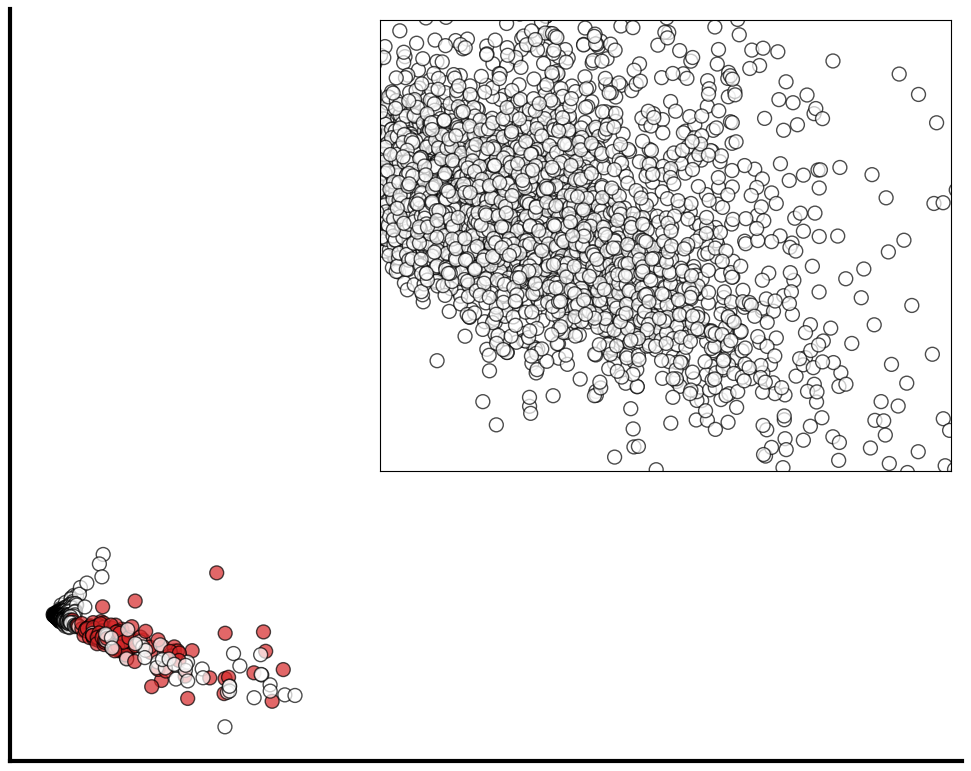

In [817]:
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# 2D

plot_dict = {}  

# Define thickness and font size for consistency
thickness = 3
font_size = 16

# List of markers to plot individually
# markers = ['SCA1', 'GATA1', 'PU1']  # Add other markers as needed
markers = ['SCA1', 'GATA1', 'PU1', 'CD41']

# Set font size for all elements globally
plt.rc('font', size=font_size)
plt.rc('axes', titlesize=font_size)
plt.rc('axes', labelsize=font_size)
plt.rc('legend', fontsize=font_size)
plt.rc('figure', titlesize=font_size)

# Create individual plots for each marker
for marker in markers:
    # Set up figure and main plot
    fig, ax = plt.subplots(figsize=(10, 8))
    df_pivot2['color'] = df_pivot2['combined_marker_status'].apply(
        lambda x: combined_palette[marker] if marker in x else 'white'
    )

    # Main scatter plot
    sns.scatterplot(
        data=df_pivot2, x='PCA1', y='PCA2', ax=ax, color=df_pivot2['color'],
        s=100, edgecolor='black', linewidth=1, alpha=0.7
    )

    # Customize main plot appearance
    # ax.set_title(f"{marker}")
    ax.legend([], [], frameon=False)  # Remove main plot legend
    ax.spines['top'].set_linewidth(0)
    ax.spines['right'].set_linewidth(0)
    ax.spines['bottom'].set_linewidth(thickness)
    ax.spines['left'].set_linewidth(thickness)
    ax.xaxis.set_tick_params(width=thickness)
    ax.yaxis.set_tick_params(width=thickness)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    # ax.set_xticks([0, 800])
    # ax.set_yticks([-40, 0, 80])
    # ax.set_xlabel("PCA 1" if marker == markers[0] else '')
    # ax.set_ylabel("PCA 2" if marker == markers[0] else '')

    # Create inset plot
    axins = inset_axes(ax, width="60%", height="60%", loc='upper right')
    sns.scatterplot(
        data=df_pivot2, x='PCA1', y='PCA2', color=df_pivot2['color'], s=100, ax=axins, edgecolor='black', linewidth=1, alpha=0.7
    )
    
    # Inset appearance
    axins.set_xlim([-2, 2])  # Adjust limits as needed
    axins.set_ylim([-2, 2])  # Adjust limits as needed
    axins.set_xticks([])
    axins.set_yticks([])
    axins.set_xlabel('')
    axins.set_ylabel('')
    axins.legend([], [], frameon=False)  # Remove inset legend

    # Show plot
    plt.tight_layout()

    # Add the plot to a dict:
    plot_dict[marker] = fig

    # plt.show()

/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/1077711693.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


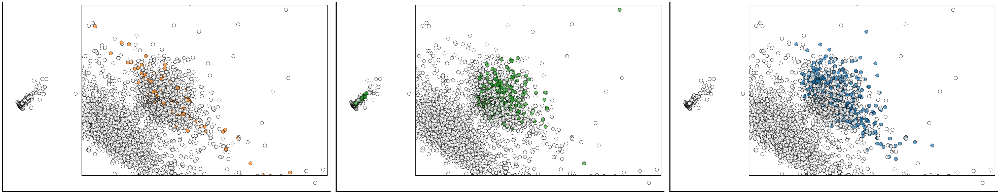

In [818]:
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

df_plot = df_pivot

# Define thickness and font size for consistency
thickness = 3
font_size = 16

# List of markers to plot individually
markers = ['SCA1', 'GATA1', 'PU1']
# markers = ['SCA1', 'GATA1', 'PU1', 'CD41']

# Set font size for all elements globally
plt.rc('font', size=font_size)
plt.rc('axes', titlesize=font_size)
plt.rc('axes', labelsize=font_size)
plt.rc('legend', fontsize=font_size)
plt.rc('figure', titlesize=font_size)

# Create a figure with 3 subplots side by side
fig, axes = plt.subplots(1, 3, figsize=(40, 8))

for ax, marker in zip(axes, markers):
    # Set up data coloring for the current marker
    df_plot['color'] = df_plot['combined_marker_status'].apply(
        lambda x: combined_palette[marker] if marker in x else 'white'
    )

    # Main scatter plot
    sns.scatterplot(
        data=df_plot, x='PCA1', y='PCA2', ax=ax, color=df_plot['color'],
        s=100, edgecolor='black', linewidth=1, alpha=0.7
    )

    # Customize main plot appearance
    ax.set_title(f"")
    ax.legend([], [], frameon=False)  # Remove main plot legend
    ax.spines['top'].set_linewidth(0)
    ax.spines['right'].set_linewidth(0)
    ax.spines['bottom'].set_linewidth(thickness)
    ax.spines['left'].set_linewidth(thickness)
    ax.xaxis.set_tick_params(width=thickness)
    ax.yaxis.set_tick_params(width=thickness)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Create inset plot
    axins = inset_axes(ax, width="75%", height="90%", loc='upper right')
    sns.scatterplot(
        data=df_plot, x='PCA1', y='PCA2', color=df_plot['color'], s=100,
        ax=axins, edgecolor='black', linewidth=1, alpha=0.7
    )
    
    # Customize inset appearance
    axins.set_xlim([-2, 2])  # Adjust limits as needed
    axins.set_ylim([-2, 2])  # Adjust limits as needed
    axins.set_xticks([])
    axins.set_yticks([])
    axins.set_xlabel('')
    axins.set_ylabel('')
    axins.legend([], [], frameon=False)  # Remove inset legend

# Adjust layout and display
plt.tight_layout()
plt.show()


/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/1964741851.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


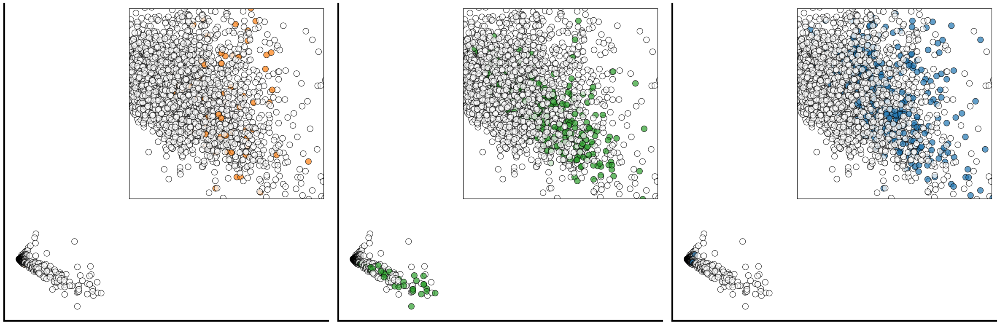

In [819]:
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Define thickness and font size for consistency
thickness = 3
font_size = 16

# List of markers to plot individually
markers = ['SCA1', 'GATA1', 'PU1']
markers = ['SCA1', 'GATA1', 'PU1', 'CD41']

# Set font size for all elements globally
plt.rc('font', size=font_size)
plt.rc('axes', titlesize=font_size)
plt.rc('axes', labelsize=font_size)
plt.rc('legend', fontsize=font_size)
plt.rc('figure', titlesize=font_size)

# Create a figure with 3 subplots side by side
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

for ax, marker in zip(axes, markers):
    # Set up data coloring for the current marker
    df_pivot2['color'] = df_pivot2['combined_marker_status'].apply(
        lambda x: combined_palette[marker] if marker in x else 'white'
    )

    # Main scatter plot
    sns.scatterplot(
        data=df_pivot2, x='PCA1', y='PCA2', ax=ax, color=df_pivot2['color'],
        s=100, edgecolor='black', linewidth=1, alpha=0.7
    )

    # Customize main plot appearance
    ax.set_title(f"")
    ax.legend([], [], frameon=False)  # Remove main plot legend
    ax.spines['top'].set_linewidth(0)
    ax.spines['right'].set_linewidth(0)
    ax.spines['bottom'].set_linewidth(thickness)
    ax.spines['left'].set_linewidth(thickness)
    ax.xaxis.set_tick_params(width=thickness)
    ax.yaxis.set_tick_params(width=thickness)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Create inset plot
    axins = inset_axes(ax, width="60%", height="60%", loc='upper right')
    sns.scatterplot(
        data=df_pivot2, x='PCA1', y='PCA2', color=df_pivot2['color'], s=100,
        ax=axins, edgecolor='black', linewidth=1, alpha=0.7
    )
    
    # Customize inset appearance
    axins.set_xlim([-2, 2])  # Adjust limits as needed
    axins.set_ylim([-2, 2])  # Adjust limits as needed
    axins.set_xticks([])
    axins.set_yticks([])
    axins.set_xlabel('')
    axins.set_ylabel('')
    axins.legend([], [], frameon=False)  # Remove inset legend

# Adjust layout and display
plt.tight_layout()
plt.show()


In [820]:
# TSNE

from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=2)#, random_state=0)
tsne2 = TSNE(n_components=2)#, random_state=0)
tsne3 = TSNE(n_components=2)#, random_state=0)
tsne4 = TSNE(n_components=2)#, random_state=0)
tsne_results = tsne.fit_transform(features)
tsne_results2 = tsne2.fit_transform(features2)
tsne_results3 = tsne3.fit_transform(features3)
tsne_results4 = tsne4.fit_transform(features4)

# Add t-SNE results to the DataFrame
df_pivot['TSNE1'] = tsne_results[:, 0]
df_pivot['TSNE2'] = tsne_results[:, 1]
df_pivot2['TSNE1'] = tsne_results2[:, 0]
df_pivot2['TSNE2'] = tsne_results2[:, 1]
df_pivot3['TSNE1'] = tsne_results3[:, 0]
df_pivot4['TSNE1'] = tsne_results4[:, 0]
df_pivot3['TSNE2'] = tsne_results3[:, 1]
df_pivot4['TSNE2'] = tsne_results4[:, 1]


/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/120916851.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pivot['TSNE1'] = tsne_results[:, 0]
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/120916851.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_pivot['TSNE2'] = tsne_results[:, 1]
/var/folders/33/8fj_gn7d4wj3r70mvvqjp9zh0000gn/T/ipykernel_11970/120916851.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, 

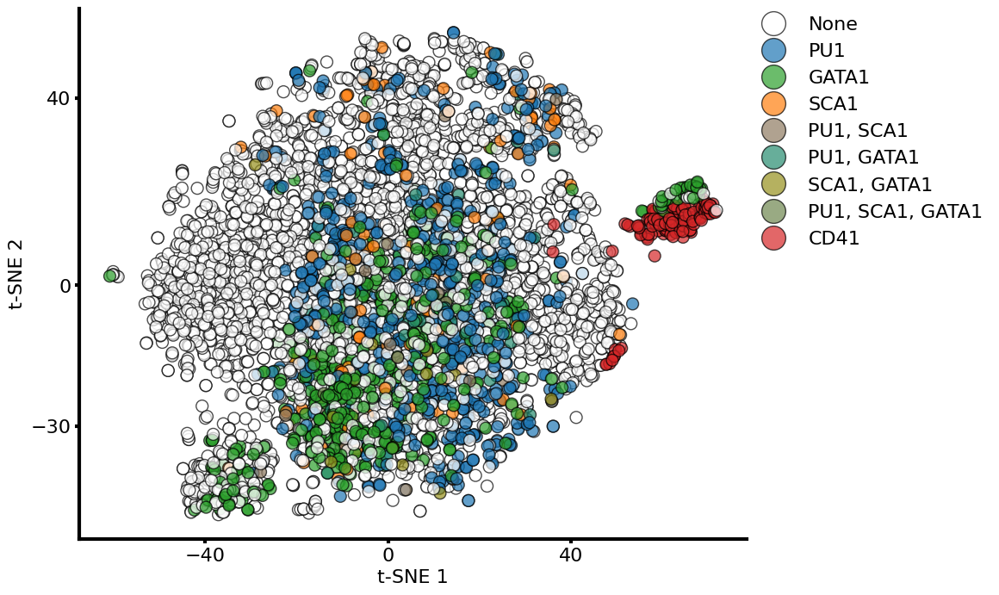

In [821]:
from matplotlib.colors import to_rgb, to_hex
import itertools

# Starting palette with distinct colors for single markers
palette = {
    "PU1": "#1f77b4",   # muted blue
    "SCA1": "#ff7f0e",  # muted orange
    "GATA1": "#2ca02c", # muted green
    "CD41": "#d62728",   # muted red
    "None": "white"      # white for no markers
}

# Function to calculate combined color
def mix_colors(markers):
    # Get the RGB colors of each marker
    rgb_colors = [to_rgb(palette[marker]) for marker in markers]
    # Calculate the average RGB values
    avg_rgb = tuple(sum(col) / len(markers) for col in zip(*rgb_colors))
    # Convert the average RGB back to hex
    return to_hex(avg_rgb)

# Generate colors for all unique combinations of the markers with all permutations
combined_palette = {}
for r in range(1, len(palette) + 1):
    for combo in itertools.combinations(palette.keys(), r):
        # Calculate the mixed color for the combination
        color = mix_colors(combo)
        # Create an entry for each permutation of the combination
        for perm in itertools.permutations(combo):
            combo_name = ", ".join(perm)
            combined_palette[combo_name] = color

# Display the final combined_palette dictionary
combined_palette

plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot, x='TSNE1', y='TSNE2', hue='combined_marker_status', palette=combined_palette, s=100, alpha=0.7, edgecolor='black', linewidth=1)

# Move the legend outside the plot
plt.legend(title='', bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(0)
plt.gca().spines['right'].set_linewidth(0)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Only keep 3 ticks on each axis
plt.gca().set_xticks([-40, 0, 40])
plt.gca().set_yticks([-30, 0, 40])

# Set labels for the axes
plt.xlabel('t-SNE 1', fontsize=16)
plt.ylabel('t-SNE 2', fontsize=16)

plt.show()

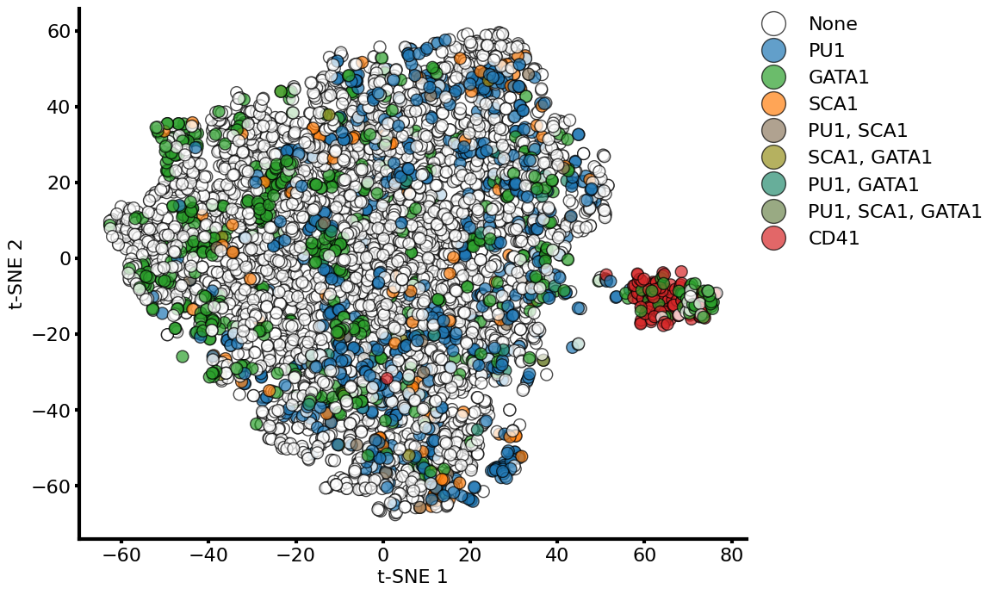

In [822]:
from matplotlib.colors import to_rgb, to_hex
import itertools

# Starting palette with distinct colors for single markers
palette = {
    "PU1": "#1f77b4",   # muted blue
    "SCA1": "#ff7f0e",  # muted orange
    "GATA1": "#2ca02c", # muted green
    "CD41": "#d62728",   # muted red
    "None": "white"      # white for no markers
}

# Function to calculate combined color
def mix_colors(markers):
    # Get the RGB colors of each marker
    rgb_colors = [to_rgb(palette[marker]) for marker in markers]
    # Calculate the average RGB values
    avg_rgb = tuple(sum(col) / len(markers) for col in zip(*rgb_colors))
    # Convert the average RGB back to hex
    return to_hex(avg_rgb)

# Generate colors for all unique combinations of the markers with all permutations
combined_palette = {}
for r in range(1, len(palette) + 1):
    for combo in itertools.combinations(palette.keys(), r):
        # Calculate the mixed color for the combination
        color = mix_colors(combo)
        # Create an entry for each permutation of the combination
        for perm in itertools.permutations(combo):
            combo_name = ", ".join(perm)
            combined_palette[combo_name] = color

# Display the final combined_palette dictionary
combined_palette

# Plot
plot_subset = df_pivot2[(df_pivot2['combined_marker_status'] == 'GATA1') | 
                       (df_pivot2['combined_marker_status'] == 'SCA1') | 
                       (df_pivot2['combined_marker_status'] == 'SCA1, GATA1') |
                        (df_pivot2['combined_marker_status'] == 'PU1, SCA1, GATA1')]


plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot2, x='TSNE1', y='TSNE2', hue='combined_marker_status', palette=combined_palette, s=100, alpha=0.7, edgecolor='black', linewidth=1)

# Move the legend outside the plot
plt.legend(title='', bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(0)
plt.gca().spines['right'].set_linewidth(0)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Only keep 3 ticks on each axis
# plt.gca().set_xticks([-40, 0, 40])
# plt.gca().set_yticks([-30, 0, 40])

# Set labels for the axes
plt.xlabel('t-SNE 1', fontsize=16)
plt.ylabel('t-SNE 2', fontsize=16)

plt.show()

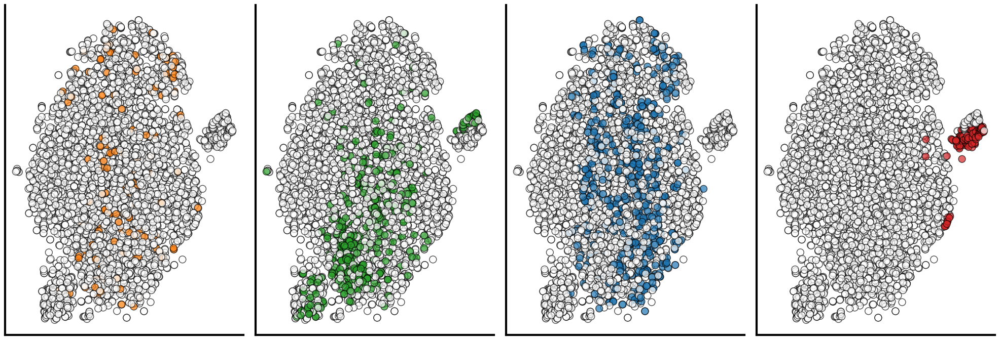

In [823]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axes = plt.subplots(1, 4, figsize=(20, 7))
markers = ['SCA1', 'GATA1', 'PU1']
markers = ['SCA1', 'GATA1', 'PU1', 'CD41']

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

for ax, marker in zip(axes, markers):
    # Filter for current marker, if combined_marker_status contains the marker
    plot_subset = df_pivot[df_pivot['combined_marker_status'].str.contains(marker)]
    
    # Create a color mask for white for other markers
    df_pivot['color'] = df_pivot['combined_marker_status'].apply(
        lambda x: palette[marker] if marker in x else 'white'
    )
    
    # Scatter plot for the current marker
    sns.scatterplot(data=df_pivot, x='TSNE1', y='TSNE2', ax=ax, 
                    color=df_pivot['color'], s=100, edgecolor='black', linewidth=1, alpha=0.7)
    
    # ax.set_title(marker)

    # Set labels only for the first plot
    # if marker == 'SCA1':
    #     ax.set_xlabel('t-SNE 1')
    #     ax.set_ylabel('t-SNE 2')
    # else:
    #     ax.set_xlabel('t-SNE 1')
    #     ax.set_ylabel('')
    
    # Remove axis ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Remove ticks and tick labels
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

    # Make the axis lines thicker
    thickness = 3
    ax.spines['top'].set_linewidth(0)
    ax.spines['right'].set_linewidth(0)
    ax.spines['bottom'].set_linewidth(thickness)
    ax.spines['left'].set_linewidth(thickness)

# Legend
# Labels for legend
legend_labels = ['None', 'SCA1', 'GATA1', 'PU1', 'CD41']
# Colors for each label, from combined_palette, map to the labels
legend_colors = [combined_palette[label] for label in legend_labels]

# legend_colors = ['#FFFFFF', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Create a legend with the labels and colors
# legend = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, alpha=.7, markeredgecolor='black', linewidth=1, markerfacecolor=color)
        #   for label, color in zip(legend_labels, legend_colors)]

# s=100, alpha=0.7, edgecolor='black', linewidth=1

# plt.legend(handles=legend, bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)
# Adjust the layout
plt.tight_layout()
plt.show()


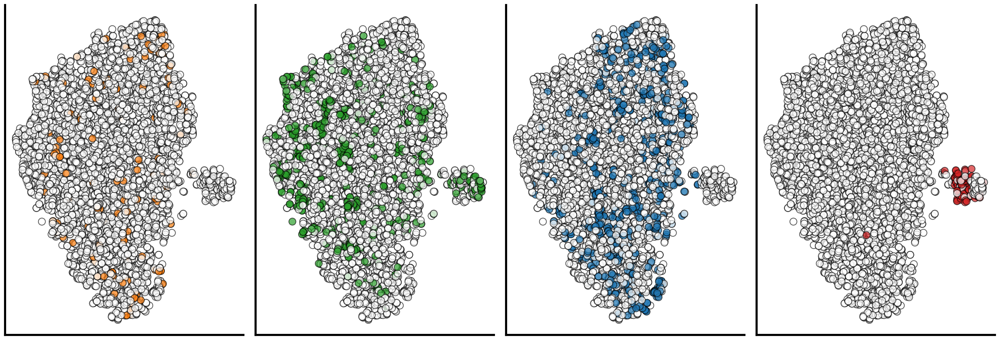

In [824]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axes = plt.subplots(1, 4, figsize=(20, 7))
markers = ['SCA1', 'GATA1', 'PU1', 'CD41']
# markers = ['SCA1', 'GATA1', 'PU1']

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

for ax, marker in zip(axes, markers):
    # Filter for current marker, if combined_marker_status contains the marker
    plot_subset = df_pivot2[df_pivot2['combined_marker_status'].str.contains(marker)]
    
    # Create a color mask for white for other markers
    df_pivot2['color'] = df_pivot2['combined_marker_status'].apply(
        lambda x: palette[marker] if marker in x else 'white'
    )
    
    # Scatter plot for the current marker
    sns.scatterplot(data=df_pivot2, x='TSNE1', y='TSNE2', ax=ax, 
                    color=df_pivot2['color'], s=100, edgecolor='black', linewidth=1, alpha=0.7)
    
    # ax.set_title(marker)

    # Set labels only for the first plot
    # if marker == 'SCA1':
    #     ax.set_xlabel('t-SNE 1')
    #     ax.set_ylabel('t-SNE 2')
    # else:
    #     ax.set_xlabel('t-SNE 1')
    #     ax.set_ylabel('')
    
    # Remove axis ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Remove ticks and tick labels
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

    # Make the axis lines thicker
    thickness = 3
    ax.spines['top'].set_linewidth(0)
    ax.spines['right'].set_linewidth(0)
    ax.spines['bottom'].set_linewidth(thickness)
    ax.spines['left'].set_linewidth(thickness)

# Adjust the layout
plt.tight_layout()
plt.show()


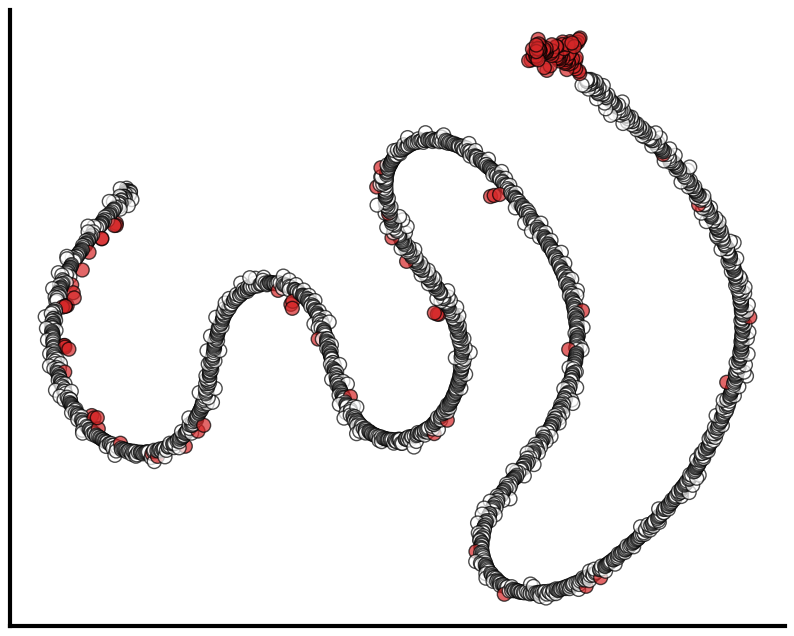

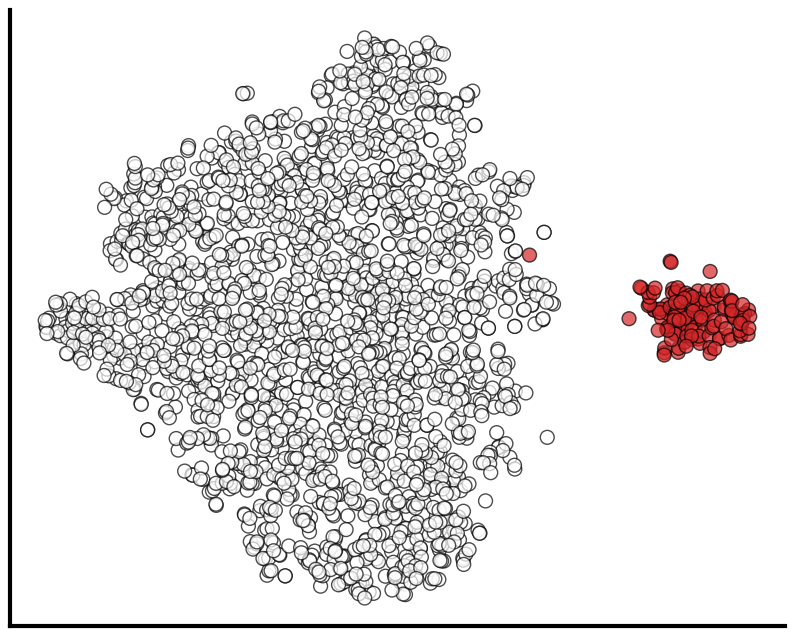

In [825]:
# Tsne plots for CD41

from matplotlib.colors import to_rgb, to_hex
import itertools

# Starting palette with distinct colors for single markers
palette = {
    "PU1": "#1f77b4",   # muted blue
    "SCA1": "#ff7f0e",  # muted orange
    "GATA1": "#2ca02c", # muted green
    "CD41": "#d62728",   # muted red
    "None": "white"      # white for no markers
}

# Function to calculate combined color
def mix_colors(markers):
    # Get the RGB colors of each marker
    rgb_colors = [to_rgb(palette[marker]) for marker in markers]
    # Calculate the average RGB values
    avg_rgb = tuple(sum(col) / len(markers) for col in zip(*rgb_colors))
    # Convert the average RGB back to hex
    return to_hex(avg_rgb)

# Generate colors for all unique combinations of the markers with all permutations
combined_palette = {}
for r in range(1, len(palette) + 1):
    for combo in itertools.combinations(palette.keys(), r):
        # Calculate the mixed color for the combination
        color = mix_colors(combo)
        # Create an entry for each permutation of the combination
        for perm in itertools.permutations(combo):
            combo_name = ", ".join(perm)
            combined_palette[combo_name] = color
# 3D
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot3, x='TSNE1', y='TSNE2', hue='combined_marker_status', palette=combined_palette, s=100, alpha=0.7, edgecolor='black', linewidth=1)

# Move the legend outside the plot
plt.legend([], [], frameon=False)
# plt.legend(title='', bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(0)
plt.gca().spines['right'].set_linewidth(0)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Only keep 3 ticks on each axis
# plt.gca().set_xticks([-40, 0, 40])
# plt.gca().set_yticks([-30, 0, 40])

# Set labels for the axes
# plt.xlabel('t-SNE 1', fontsize=16)
# plt.ylabel('t-SNE 2', fontsize=16)

plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])

plt.show()

# 2D
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pivot4, x='TSNE1', y='TSNE2', hue='combined_marker_status', palette=combined_palette, s=100, alpha=0.7, edgecolor='black', linewidth=1)

# Move the legend outside the plot
# Remove legend
plt.legend([], [], frameon=False)
# plt.legend(title='', bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0., frameon=False, fontsize=16, markerscale=2)

# Set font size for all elements to be 16
plt.rc('font', size=16)
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rc('legend', fontsize=16)
plt.rc('figure', titlesize=16)

# Make the axis lines thicker
thickness = 3
plt.gca().spines['top'].set_linewidth(0)
plt.gca().spines['right'].set_linewidth(0)
plt.gca().spines['bottom'].set_linewidth(thickness)
plt.gca().spines['left'].set_linewidth(thickness)
# Set ticks to be thicker
plt.gca().xaxis.set_tick_params(width=thickness)
plt.gca().yaxis.set_tick_params(width=thickness)

# Only keep 3 ticks on each axis
# plt.gca().set_xticks([-40, 0, 40])
# plt.gca().set_yticks([-30, 0, 40])

# Set labels for the axes
# plt.xlabel('t-SNE 1', fontsize=16)
# plt.ylabel('t-SNE 2', fontsize=16)
# Remove labels, ticks
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])


plt.show()

In [826]:
# from matplotlib.colors import to_rgb, to_hex
# import itertools

# # Starting palette with distinct colors for single markers
# palette = {
#     "PU1": "#1f77b4",   # muted blue
#     "SCA1": "#ff7f0e",  # muted orange
#     "GATA1": "#2ca02c", # muted green
#     "CD41": "#d62728",   # muted red
#     "None": "white"      # white for no markers
# }

# # Function to calculate combined color
# def mix_colors(markers):
#     # Get the RGB colors of each marker
#     rgb_colors = [to_rgb(palette[marker]) for marker in markers]
#     # Calculate the average RGB values
#     avg_rgb = tuple(sum(col) / len(markers) for col in zip(*rgb_colors))
#     # Convert the average RGB back to hex
#     return to_hex(avg_rgb)

# # Generate colors for all unique combinations of the markers with all permutations
# combined_palette = {}
# for r in range(1, len(palette) + 1):
#     for combo in itertools.combinations(palette.keys(), r):
#         # Calculate the mixed color for the combination
#         color = mix_colors(combo)
#         # Create an entry for each permutation of the combination
#         for perm in itertools.permutations(combo):
#             combo_name = ", ".join(perm)
#             combined_palette[combo_name] = color

# # Display the final combined_palette dictionary
# combined_palette
